#### Importing

In [4]:
# Imports! These are used to handle the model, image processing, web scraping, dataset importing, etc.

import torch
from torch import nn, optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms, models
from PIL import Image
import matplotlib.pyplot as plt
from icrawler.builtin import GoogleImageCrawler
import kagglehub
import os
from tqdm import tqdm
from IPython.display import display

c:\Users\enderkong\development\DSC412\exploringml-1\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### Setting parameters and defining transforms

In [17]:
# I assign the values for the hyperparameter values here for ease of access.

num_epochs = 5
batch_size = 50
learning_rate = 0.001
num_classes = 2

augmentations = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),  # Random horizontal flip
    transforms.RandomRotation(30),          # Random rotation between -30 and 30 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Color jitter
    transforms.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0)),  # Random crop
    transforms.ToTensor(),                  # Convert image to tensor (needed for saving)
    transforms.ToPILImage(),                # Convert tensor back to image for saving
])

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

#### Web Scraping

In the following code block, I utilize the icrawler library to scrape google and bing for images of human faces. While web scraping is a useful tool for creating datasets, it tends to include images that don't really align with the dataset.

In [ ]:
from icrawler.builtin import GoogleImageCrawler, BingImageCrawler

# Define keywords and output directory
keywords = ['Real human face', 'Portrait of human face', 'Natural human face']
output_dir = 'images'
max_images_per_keyword = 1000  # Adjust for each keyword to get a total of 3000+

# Function to configure and run a crawler
def run_crawler(crawler_class, keyword, root_dir, max_num):
    crawler = crawler_class(storage={'root_dir': root_dir})
    crawler.crawl(
        keyword=keyword,
        max_num=max_num,
        min_size=(200, 200),  # Minimum size of images
        file_idx_offset=0
    )
    crawler.downloader.sleep_interval = (1, 3)  # Add random delay to avoid blocking

# Loop through keywords and use both Google and Bing crawlers
for keyword in keywords:
    # Google crawler
    run_crawler(GoogleImageCrawler, keyword, output_dir, max_images_per_keyword)

    # Bing crawler
    run_crawler(BingImageCrawler, keyword, output_dir, max_images_per_keyword)



2024-11-19 23:52:56,087 - INFO - icrawler.crawler - start crawling...
2024-11-19 23:52:56,088 - INFO - icrawler.crawler - starting 1 feeder threads...
2024-11-19 23:52:56,089 - INFO - icrawler.crawler - starting 1 parser threads...
2024-11-19 23:52:56,090 - INFO - icrawler.crawler - starting 1 downloader threads...
2024-11-19 23:52:56,647 - INFO - parser - parsing result page https://www.google.com/search?q=Real+human+face&ijn=0&start=0&tbs=&tbm=isch
2024-11-19 23:52:56,900 - INFO - downloader - image #1	https://plus.unsplash.com/premium_photo-1664203067979-47448934fd97?fm=jpg
2024-11-19 23:52:57,346 - INFO - downloader - image #2	https://kottke.org/cdn-cgi/image/format=auto,fit=scale-down,width=1200,metadata=none/plus/misc/images/ai-faces-01.jpg
2024-11-19 23:52:57,924 - ERROR - downloader - Response status code 404, file https://t4.ftcdn.net/jpg
2024-11-19 23:52:58,273 - INFO - downloader - image #3	https://images.pexels.com/photos/614810/pexels-photo-614810.jpeg?cs=srgb&dl=pexels-si

Crawling completed!


#### Creating Augmentation Output Directory

This code block creates and assigns the input and output directories for the transformation process

In [9]:
input_dir = "dataset/images"
output_dir = "dataset/augmented_images"
#makes directory
os.makedirs(output_dir, exist_ok=True)

#### Creating Image Augmentations

This takes every image in the dataset and creates 10 variations of it, increasing the size of our data by a power of 10.

In [12]:
for image_name in tqdm(os.listdir(input_dir)):
    image_path = os.path.join(input_dir, image_name)
    
    # Skip non-image files
    if not image_name.lower().endswith(('png', 'jpg', 'jpeg')):
        continue
    
    # Open the image
    image = Image.open(image_path)

    if image.mode != 'RGB':
        image = image.convert('RGB')
    
    # Apply augmentations and save 10 variations
    for i in range(1, 11):  # Generate 10 augmentations, numbered 1 to 10
        augmented_image = augmentations(image)
        augmented_image.save(os.path.join(output_dir, f"{image_name.split('.')[0]}_aug_{i}.jpg"))

100%|██████████| 369/369 [07:59<00:00,  1.30s/it]


#### Importing Random Images Dataset

In addition to the web-scraped dataset of human faces, I decided to include a dataset of random images from kaggle. I could have also done this via webscraping, but the likelyhood of those random images containing human faces would be too high. These random images are added to the objects folder.

In [ ]:
import shutil

# Call dataset_download without the target_dir argument
path = kagglehub.dataset_download("pankajkumar2002/random-image-sample-dataset")

# Define your target directory
target_dir = "objects"
shutil.move(path, target_dir)


Dataset moved to: objects


#### Prepping datasets

This code splits the combined datasets into a training, validation, and test set.

In [13]:
# Path to the root dataset directory
root_dir = "dataset"

# Combine datasets into one labeled dataset
dataset = datasets.ImageFolder(root=root_dir, transform=transform)

# Split dataset into training, validation, and test sets
train_size = int(0.7 * len(dataset))
val_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"Dataset sizes - Train: {len(train_dataset)}, Validation: {len(val_dataset)}, Test: {len(test_dataset)}")


Dataset sizes - Train: 4808, Validation: 1373, Test: 688


#### Defining Model

This model utilizes transfer learning, a process which starts with a model that has already been created for a more general use case and is further trained for a more specific use case. We start with the ResNet18 model, a generic object detection model included in the PyTorch library.

In [18]:
# Load a pre-trained model (ResNet18) and modify for 2 classes
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, num_classes)  # Adjust the output layer

# Using GPU to train
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

c:\Users\enderkong\development\DSC412\exploringml-1\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\enderkong\development\DSC412\exploringml-1\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


#### Loss function and optimizer

This code intiializes the loss function and optimizer.

In [19]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

#### Training

This is where we define the functions for training and validating the model, which we will use later for those purposes.

In [26]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct, total = 0, 0

        # Training loop
        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

        train_accuracy = 100 * correct / total
        print(f"Epoch {epoch + 1}: Loss = {running_loss / len(train_loader):.4f}, Accuracy = {train_accuracy:.2f}%")

        # Validate the model
        validate_model(model, val_loader, criterion)

def validate_model(model, val_loader, criterion):
    model.eval()
    val_loss = 0.0
    correct, total = 0, 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

#### Testing

Here we define the test function for the model

In [20]:
def test_model(model, test_loader):
    model.eval()
    correct, total = 0, 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    test_accuracy = 100 * correct / total
    print(f"Test Accuracy = {test_accuracy:.2f}%")


#### Running Training, Validation, Testing

Here we use our constructed functions to train, validate, and test the model.

In [29]:
num_classes = len(dataset.classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Train the model
train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs)

# Test the model
test_model(model, test_loader)

Epoch 1/5: 100%|██████████| 481/481 [02:19<00:00,  3.45it/s]


Epoch 1: Loss = 0.0425, Accuracy = 98.67%


Epoch 2/5: 100%|██████████| 481/481 [02:31<00:00,  3.18it/s]


Epoch 2: Loss = 0.0506, Accuracy = 98.48%


Epoch 3/5: 100%|██████████| 481/481 [02:32<00:00,  3.15it/s]


Epoch 3: Loss = 0.0263, Accuracy = 99.33%


Epoch 4/5: 100%|██████████| 481/481 [02:29<00:00,  3.22it/s]


Epoch 4: Loss = 0.0125, Accuracy = 99.71%


Epoch 5/5: 100%|██████████| 481/481 [02:30<00:00,  3.20it/s]


Epoch 5: Loss = 0.0303, Accuracy = 99.06%
Test Accuracy = 100.00%


#### Let's Try It!

In [31]:
def predict_image(image_path, model, class_names):
    """
    Predict the class of a single image using the trained model.
    
    Args:
        image_path (str): Path to the image file.
        model (torch.nn.Module): The trained model.
        class_names (list): List of class names corresponding to model outputs.

    Returns:
        str: Predicted class name.
    """
    # Define the same transformations used during training
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Open the image and apply transformations
    image = Image.open(image_path).convert("RGB")  # Convert to RGB in case of grayscale
    image = transform(image).unsqueeze(0)  # Add batch dimension

    # Move the image to the same device as the model
    image = image.to(next(model.parameters()).device)

    # Set the model to evaluation mode
    model.eval()
    with torch.no_grad():
        # Get model predictions
        outputs = model(image)
        _, predicted_idx = torch.max(outputs, 1)

    # Return the predicted class name
    return class_names[predicted_idx.item()]

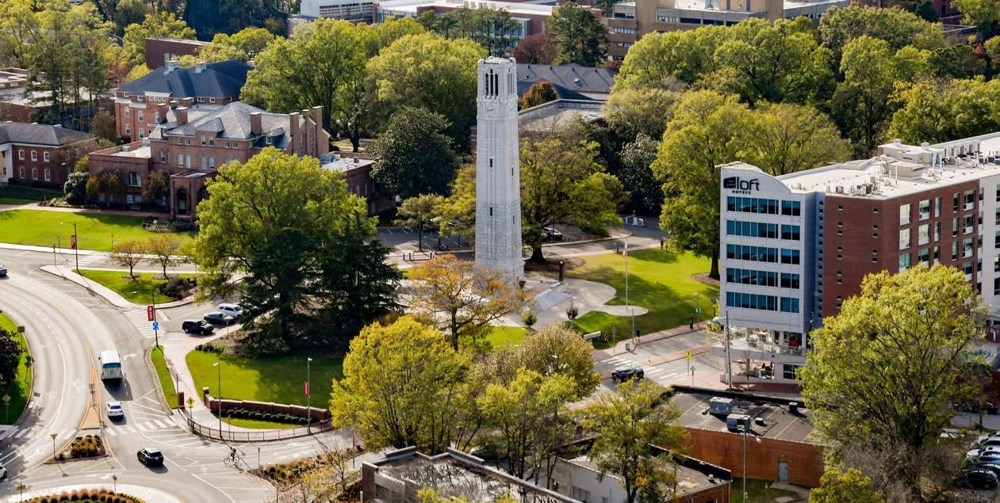

This is not a face!


In [49]:
# Path to the image to predict
image_path = "test_image_obj.jpg"

# Get class names (from the dataset)
class_names = dataset.classes  # ['augmented_images', 'objects']

# Predict the class
predicted_class = predict_image(image_path, model, class_names)

# Displaying image
image = Image.open("test_image_obj.jpg")
display(image)

if predicted_class == "objects":
    print(f"This is not a face!")
elif predicted_class == "images":
    print("This is a face!")

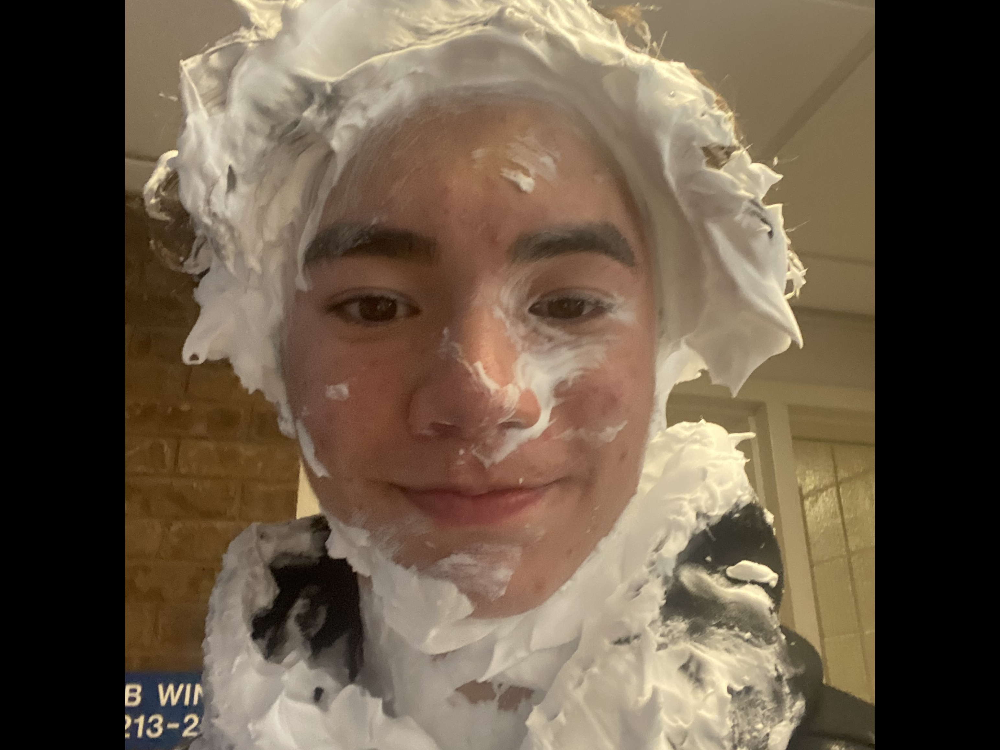

This is a face!


In [ ]:
# Path to the image to predict
image_path = "test_image_face.jpg"

# Get class names (from the dataset)
class_names = dataset.classes  # ['images', 'objects']

# Predict the class
predicted_class = predict_image(image_path, model, class_names)

# Displaying image
image = Image.open("test_image_face.jpg")
image = image.rotate(-90)
display(image)

if predicted_class == "objects":
    print(f"This is not a face!")
elif predicted_class == "images":
    print("This is a face!")